## Initial Analysis of Gulf Stream Cruise Data from Sept Cruise (Sept 4-9)

In [1]:
import matplotlib.pyplot as plt
import xarray as xr
import numpy as np

import hvplot.xarray


import cartopy.crs as crs

import pandas as pd
import glob
import hvplot.pandas  # noqa
from datetime import timedelta
from datetime import datetime

#### Pull in CDOM data and ship TSG/GPS data

In [2]:
path = 'data/sept_cruise/wscd859/' # use your path
all_files = glob.glob(path + "/*.csv")

li = []

for filename in all_files:
    df_tmp = pd.read_csv(filename, index_col=None, header=1)
    li.append(df_tmp)
cdom_df = pd.concat(li, axis=0, ignore_index=True)

cdom_df['utc_dt'] = pd.to_datetime(cdom_df['yyyy/mm/dd HH:MM:SS.fff'])

cdom_df = cdom_df.set_index('utc_dt')

df = pd.read_csv("data/sept_cruise/SW21011R_RFP/EventData/DataLogger/Data every 1 min_001.elg")
df.head()

,Date,Time,SW-ZDA-Year,SW-ZDA-Month,SW-ZDA-Day,SW-ZDA-Time,SW-GGA-Lat,SW-GGA-NorS,SW-GGA-Long,SW-GGA-EorW,...,SW-Weather-HumidRel-%,SW-Wind-WindSpeedRel,SW-Wind-WindAngleRel,TrueWind-DRV-SPEED,TrueWind-DRV-DIRECTION,TSG--temp-SBE38,TSG--sal,SW-Depth-DBT-Depth below transducer (m),DepthOverall-DRV-VALUE,Unnamed: 24
0,09/04/2021,22:57:59,2021,9,4,230119.69,3438.0721,N,7639.5131,W,...,62.1,23.70,346.29,3.65,137.98,26.5469,36.0464,15.57,16.57,NaN
1,09/04/2021,22:58:59,2021,9,4,230220.00,3437.7653,N,7639.3397,W,...,62.6,23.70,347.29,0.92,120.30,26.5202,35.9130,16.51,17.51,NaN
2,09/04/2021,22:59:59,2021,9,4,230319.70,3437.4662,N,7639.1743,W,...,62.0,19.98,344.39,1.74,100.41,26.7050,35.9890,16.34,17.34,NaN
3,09/04/2021,23:00:59,2021,9,4,230420.70,3437.1706,N,7639.0156,W,...,63.8,23.09,346.09,4.72,123.35,26.7135,36.0296,16.23,17.23,NaN
4,09/04/2021,23:01:59,2021,9,4,230520.70,3436.8780,N,7638.8561,W,...,63.5,23.38,348.79,4.31,152.50,26.8741,36.0758,16.52,17.52,NaN


In [50]:
# tsg_df = pd.read_csv('data/sept_cruise/SW21011R_RFP/TSG/TSG-_20210904-222337.Raw', names=['DateTime', 'Temp','Sal','Unknown'], delim_whitespace=True)#sep=r"s*")# names=['Date', 'Time', 'Data'])
# tsg_df = tsg_df.drop('Unknown', 1)
# tsg_df.to_csv('sept_4_9_ship_data.csv')

In [56]:
tsg_df.head()

,DateTime,Temp,Sal
0,"09/04/2021,22:57:51.709,",26.5469,36.0464
1,"09/04/2021,22:58:01.635,",26.5226,36.0374
2,"09/04/2021,22:58:11.623,",26.4849,36.0074
3,"09/04/2021,22:58:21.627,",26.4642,35.9757
4,"09/04/2021,22:58:31.627,",26.4588,35.9478


In [3]:
# This first one is the right way to do this

In [4]:
# date_time_strs = df['SW-ZDA-Year'].astype('str') + ' ' + df['SW-ZDA-Month'].astype('str') + ' ' + df['SW-ZDA-Day'].astype('str') + ' ' + df['SW-ZDA-Time'].astype('str').str[:-2].str.replace('.','')

# df['datetime'] = [datetime.strptime(x, '%Y %m %d %H%M%S') for x in date_time_strs]
# df['utc_dt'] = df['datetime']
# df  = df.set_index('utc_dt')

In [5]:
date_time_strs = df['Date'] + ' ' + df['Time']

df['datetime'] = [datetime.strptime(x, '%m/%d/%Y %H:%M:%S') for x in date_time_strs]
df['utc_dt'] = df['datetime']+ timedelta(minutes=4)
df  = df.set_index('utc_dt')

In [6]:
def dms2dd(degrees, minutes, seconds, direction):
    dd = degrees + minutes/60 + seconds/(60*60);
    if direction == 'W' or direction == 'S':
        dd *= -1
    return dd;

df['lon'] = dms2dd(pd.to_numeric(df['SW-GGA-Long'].astype(str).str[:2]).astype(float), pd.to_numeric(df['SW-GGA-Long'].astype(str).str[2:]),np.array(0), 'W')
df['lat'] = dms2dd(pd.to_numeric(df['SW-GGA-Lat'].astype(str).str[:2]).astype(float), pd.to_numeric(df['SW-GGA-Lat'].astype(str).str[2:]),np.array(0), 'E')

<AxesSubplot:>

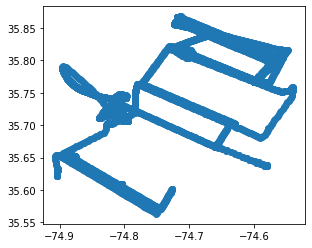

In [7]:
import geopandas as gpd

gdf = gpd.GeoDataFrame(
    df, geometry=gpd.points_from_xy(df.lon, df.lat))
gdf.loc['2021-09-5 11:00:00':'2021-09-8 20:45:00'].plot()

### Pull in FCM Data

In [105]:
fcm_df = pd.read_csv('data/sept_cruise/SW_fcm_full_bac_chla.csv')

In [106]:
fcm_df

,Sample#,Time (UTC),Date,Syn/mL,A,B,Syn_Avg,Peuks/mL,A.1,B.1,Peuks_Avg,PicoCyano/mL,A.2,B.2,PicoCyano_Avg,Bacteria_Avg,Bacteria_SD,Chla A,Chla B,Chla_Avg
0,1,12:07,9/5/2021,1,97072.84768,89405.94059,93239.39414,1,2781.456954,2257.425743,2519.441348,1,101960.26490,89504.95050,95732.60770,394223.5,112531.918300,0.2342,0.2247,0.22945
1,2,13:02,9/5/2021,2,85009.90099,79108.91089,82059.40594,2,2455.445545,2059.405941,2257.425743,2,79881.18812,76316.83168,78099.00990,458376.5,47217.437070,0.2092,0.2232,0.21620
2,3,13:48,9/5/2021,3,76435.64356,81603.96040,79019.80198,3,2396.039604,2475.247525,2435.643564,3,71841.58416,70930.69307,71386.13861,404774.0,30689.630910,0.2172,0.2477,0.23245
3,4,14:08,9/5/2021,4,90534.65347,69009.90099,79772.27723,4,2594.059406,1821.782178,2207.920792,4,84396.03960,70950.49505,77673.26733,421608.0,5847.403526,0.2397,0.2092,0.22445
4,5,14:16,9/5/2021,5,83089.10891,50019.80198,66554.45545,5,2257.425743,1564.356436,1910.891089,5,91405.94059,49663.36634,70534.65347,347586.0,15448.738500,0.2377,0.2267,0.23220
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
81,82,14:46,9/7/2021,82,18910.89109,19748.34437,19329.61773,82,1445.544554,1052.980132,1249.262343,82,106178.21780,100033.11260,103105.66520,298545.5,16804.934290,-999.0000,-999.0000,-999.00000
82,83,14:52,9/7/2021,83,21544.55446,20165.56291,20855.05868,83,1188.118812,1450.331126,1319.224969,83,98693.06931,99019.86755,98856.46843,229880.0,35541.682570,-999.0000,-999.0000,-999.00000
83,84,15:07,9/7/2021,84,35366.33663,32304.63576,33835.48620,84,1663.366337,1152.317881,1407.842109,84,91326.73267,79649.00662,85487.86965,315459.0,22315.742600,-999.0000,-999.0000,-999.00000
84,85,15:10,9/7/2021,85,38871.28713,41543.04636,40207.16674,85,1782.178218,1390.728477,1586.453347,85,87108.91089,78397.35099,82753.13094,344822.5,57600.504310,-999.0000,-999.0000,-999.00000


In [107]:
date_time_strs = fcm_df['Date'] + ' ' + fcm_df['Time (UTC)']

fcm_df['datetime'] = [datetime.strptime(x, '%m/%d/%Y %H:%M') for x in date_time_strs]

In [108]:
fcm_df['utc_dt'] = fcm_df['datetime']
fcm_df  = fcm_df.set_index('utc_dt')

In [109]:
fcm_df.head()

,Sample#,Time (UTC),Date,Syn/mL,A,B,Syn_Avg,Peuks/mL,A.1,B.1,...,PicoCyano/mL,A.2,B.2,PicoCyano_Avg,Bacteria_Avg,Bacteria_SD,Chla A,Chla B,Chla_Avg,datetime
utc_dt,,,,,,,,,,,,,,,,,,,,,
2021-09-05 12:07:00,1,12:07,9/5/2021,1,97072.84768,89405.94059,93239.39414,1,2781.456954,2257.425743,...,1,101960.26490,89504.95050,95732.60770,394223.5,112531.918300,0.2342,0.2247,0.22945,2021-09-05 12:07:00
2021-09-05 13:02:00,2,13:02,9/5/2021,2,85009.90099,79108.91089,82059.40594,2,2455.445545,2059.405941,...,2,79881.18812,76316.83168,78099.00990,458376.5,47217.437070,0.2092,0.2232,0.21620,2021-09-05 13:02:00
2021-09-05 13:48:00,3,13:48,9/5/2021,3,76435.64356,81603.96040,79019.80198,3,2396.039604,2475.247525,...,3,71841.58416,70930.69307,71386.13861,404774.0,30689.630910,0.2172,0.2477,0.23245,2021-09-05 13:48:00
2021-09-05 14:08:00,4,14:08,9/5/2021,4,90534.65347,69009.90099,79772.27723,4,2594.059406,1821.782178,...,4,84396.03960,70950.49505,77673.26733,421608.0,5847.403526,0.2397,0.2092,0.22445,2021-09-05 14:08:00
2021-09-05 14:16:00,5,14:16,9/5/2021,5,83089.10891,50019.80198,66554.45545,5,2257.425743,1564.356436,...,5,91405.94059,49663.36634,70534.65347,347586.0,15448.738500,0.2377,0.2267,0.23220,2021-09-05 14:16:00


In [110]:
lats = []
lons = []
for i in range(len(fcm_df)):
    row = df.iloc[df.index.get_loc(pd.to_datetime(fcm_df.iloc[i].datetime), method='nearest')]
    lats.append(row.lat)
    lons.append(row.lon)
fcm_df['lat'] = lats
fcm_df['lon'] = lons

In [49]:
# fcm_df[['Sample#', 'datetime', 'lat', 'lon']].to_csv('sept_4_9_sample_time_loc.csv')

In [112]:
fcm_gdf = gpd.GeoDataFrame(fcm_df, geometry=gpd.points_from_xy(fcm_df.lon, fcm_df.lat))

In [116]:
fcm_gdf.columns

Index(['Sample#', 'Time (UTC)', 'Date', 'Syn/mL', 'A', 'B', 'Syn_Avg',
       'Peuks/mL', 'A.1', 'B.1', 'Peuks_Avg', 'PicoCyano/mL', 'A.2', 'B.2',
       'PicoCyano_Avg', 'Bacteria_Avg', 'Bacteria_SD', 'Chla A', 'Chla B',
       'Chla_Avg', 'datetime', 'lat', 'lon', 'geometry'],
      dtype='object')

In [113]:
start_times[i], end_times[i]

('2021-09-5 18:15:00', '2021-09-5 20:30:00')

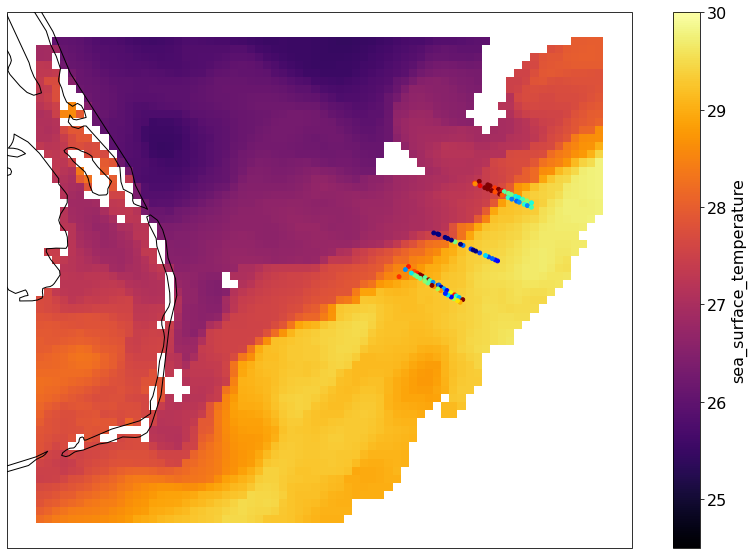

In [121]:
i=1
fig, ax = plt.subplots(1,1, figsize=(12,8), subplot_kw=dict(projection=crs.PlateCarree()))
ax.coastlines(resolution='10m')
goes_ds.sel(time=slice(pd.to_datetime(start_times[i])+timedelta(hours=1), pd.to_datetime(start_times[i])+timedelta(hours=2))).sea_surface_temperature[:,90:150, 110:180].mean(dim='time').plot(ax=ax, vmin=24.5, vmax=30, cmap='inferno')
# fig.savefig('sst_sept0523_studypoints.png',dpi=400)
# ax[1].set_title(titles[i] + ' zoom')
fig.tight_layout()
#     fig.savefig('figs/'+titles[i] +'sat_overview.png')
#     plt.close()

fcm_gdf.plot(ax=ax, markersize=15, column='Chla_Avg', vmin=.1,vmax=.25, cmap='jet')
# plt.savefig('sampling_locations_sept4-9.png',dpi=300)
plt.show()

<AxesSubplot:>

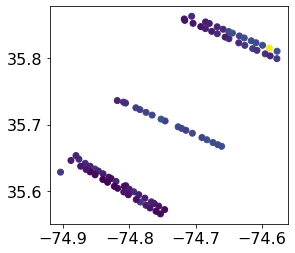

In [124]:
fcm_gdf.plot(column='PicoCyano_Avg')

#### Visualizing SST from GOES

In [8]:
goes_ds = xr.open_dataset('data/jplStarG16SSTv270_8997_d932_2101.nc')

/srv/conda/envs/notebook/lib/python3.8/site-packages/xarray/conventions.py:512: SerializationWarning: variable 'sea_surface_temperature' has multiple fill values {-327.67, -327.68}, decoding all values to NaN.
  new_vars[k] = decode_cf_variable(


In [10]:
goes_ds.sea_surface_temperature[:,:, :].resample(time="6H", skipna=True).mean().hvplot.quadmesh(
    'longitude', 'latitude', projection=crs.PlateCarree(), project=True,
    cmap='inferno', dynamic=True, 
    frame_height=600, clim=(25.5, 30), rasterize=True) * df.loc['2021-09-5 11:00:00':'2021-09-7 15:30:00'].hvplot.points('lon', 'lat', geo=True, color='red', alpha=0.05)

:DynamicMap   [time]
   :Overlay
      .Image.I  :Image   [longitude,latitude]   (sea_surface_temperature)
      .Points.I :Points   [lon,lat]

In [11]:
goes_ds.sea_surface_temperature[:,:, :].resample(time="1D", skipna=True).mean().hvplot.quadmesh(
    'longitude', 'latitude', projection=crs.PlateCarree(), project=True,
    cmap='inferno', dynamic=True, 
    frame_height=600, clim=(25.5, 30), rasterize=True) * df.loc['2021-09-5 11:00:00':'2021-09-7 15:30:00'].hvplot.points('lon', 'lat', geo=True, color='red', alpha=0.05)

:DynamicMap   [time]
   :Overlay
      .Image.I  :Image   [longitude,latitude]   (sea_surface_temperature)
      .Points.I :Points   [lon,lat]

In [12]:
goes_ds.sea_surface_temperature[:,:, :].hvplot.quadmesh(
    'longitude', 'latitude', projection=crs.PlateCarree(), project=True,
    cmap='inferno', dynamic=True, 
    frame_height=600, clim=(25.5, 30), rasterize=True) * df.loc['2021-09-5 11:00:00':'2021-09-7 15:30:00'].hvplot.points('lon', 'lat', geo=True, color='red', alpha=0.05)

:DynamicMap   [time]
   :Overlay
      .Image.I  :Image   [longitude,latitude]   (sea_surface_temperature)
      .Points.I :Points   [lon,lat]

<GeoAxesSubplot:title={'center':'time = 2021-08-19T04:00:00'}, xlabel='Longitude [degrees_east]', ylabel='Latitude [degrees_north]'>

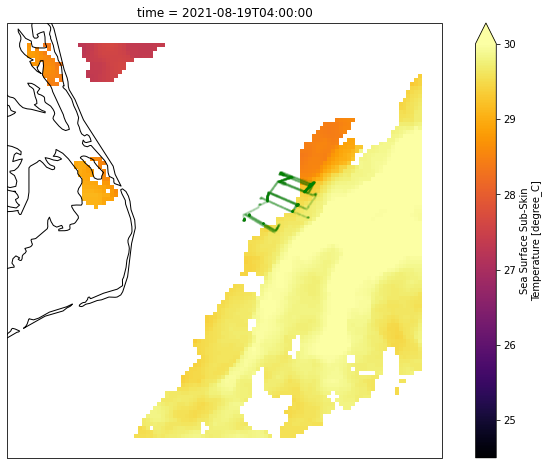

In [13]:
fig, ax = plt.subplots(figsize=(12,8), subplot_kw=dict(projection=crs.PlateCarree()))
ax.coastlines(resolution='10m')
goes_ds.sea_surface_temperature[100,75:175, 100:200].plot(ax=ax, vmin=24.5, vmax=30, cmap='inferno')
gdf.loc['2021-09-5 11:00:00':'2021-09-7 15:30:00'].plot(ax=ax, markersize=2, color='green', alpha=.05)
# fig.savefig('sst_sept0523_studypoints.png',dpi=400)

In [9]:
plt.rcParams.update({'font.size': 16})

### Visualizing the CDOM/Ship Data

In [17]:
# gdf.reset_index().drop(columns=['datetime', 'utc_dt']).to_file('compass_cruise.shp')

In [18]:
df.loc['2021-09-5 11:00:00':'2021-09-7 15:30:00'].hvplot.points('lon', 'lat', geo=True, color='red', alpha=0.05,tiles='EsriNatGeo')

:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [lon,lat]

<ipython-input-10-df14b368788f>:2: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  cdom_df.loc['2021-09-5 11:00:00':'2021-09-9 18:30:00'].rolling(window=60).mean().plot(y=' V', ax=ax)


(0.05, 0.5)

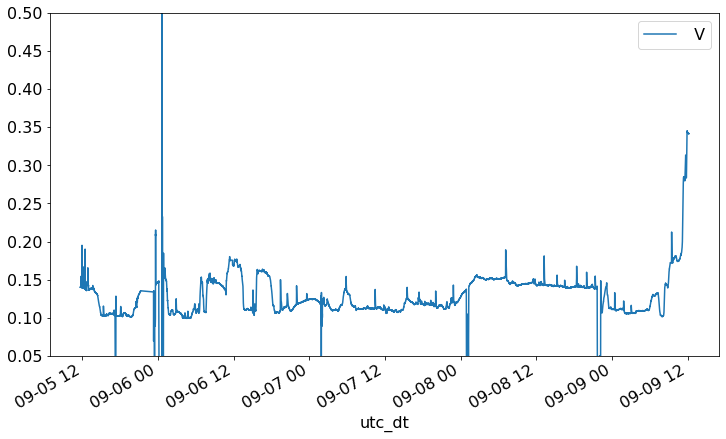

In [10]:
fig,ax = plt.subplots(figsize=(12,7))
cdom_df.loc['2021-09-5 11:00:00':'2021-09-9 18:30:00'].rolling(window=60).mean().plot(y=' V', ax=ax)
ax.set_ylim(0.05,.5)

In [20]:
df.loc['2021-09-5 13:00:00':'2021-09-5 17:30:00'].hvplot.points('lon', 'lat', geo=True, color='red', alpha=0.05,tiles='EsriNatGeo')

:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [lon,lat]

## Working through each transect with data and SST

<GeoAxesSubplot:title={'center':'time = 2021-08-19T04:00:00'}, xlabel='Longitude [degrees_east]', ylabel='Latitude [degrees_north]'>

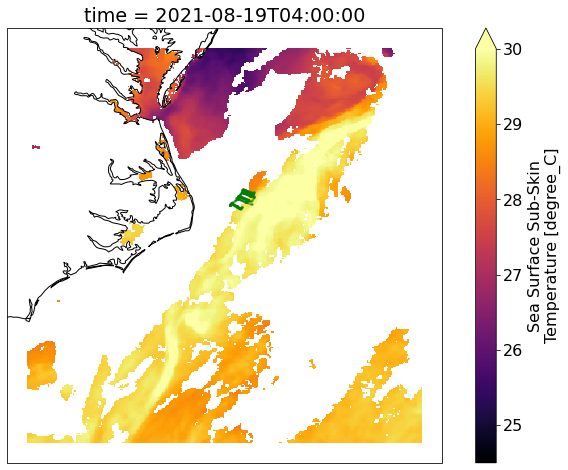

In [21]:
fig, ax = plt.subplots(figsize=(12,8), subplot_kw=dict(projection=crs.PlateCarree()))
ax.coastlines(resolution='10m')
goes_ds.sea_surface_temperature[100,:, :].plot(ax=ax, vmin=24.5, vmax=30, cmap='inferno')
gdf.loc['2021-09-5 11:00:00':'2021-09-7 15:30:00'].plot(ax=ax, markersize=2, color='green', alpha=.05)
# fig.savefig('sst_sept0523_studypoints.png',dpi=400)

In [23]:
plt.rcParams.update({'font.size': 16})

In [36]:
fcm_df.columns

Index(['Sample#', 'Time (UTC)', 'Date', 'Syn/mL', 'A', 'B', 'Syn_Avg',
       'Peuks/mL', 'A.1', 'B.1', 'Peuks_Avg', 'PicoCyano/mL', 'A.2', 'B.2',
       'PicoCyano_Avg', 'datetime'],
      dtype='object')

In [140]:
fcm_df.Bacteria_Avg.min(), fcm_df.Bacteria_Avg.max()

(162573.0, 490518.5)

In [133]:
fcm_df['Chla_Avg'][fcm_df['Chla_Avg']==-999]=np.nan

<ipython-input-133-a5003a0a14a8>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fcm_df['Chla_Avg'][fcm_df['Chla_Avg']==-999]=np.nan


(0.0, 0.5)

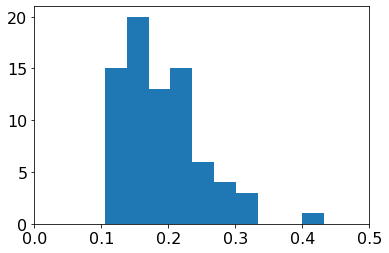

In [135]:
fig, ax = plt.subplots()
ax.hist(fcm_df.Chla_Avg)
ax.set_xlim(0,.5)

<ipython-input-146-650edb0ded04>:10: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  if fcm_df.loc[start_times[i]:end_times[i]]['Syn_Avg'].empty:
<ipython-input-146-650edb0ded04>:45: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  p3 = ax2.scatter(cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean().index, cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean()[' V'], color='brown', label='CDOM', s=2)
<ipython-input-146-650edb0ded04>:45: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  p3 = ax2.scatter(cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean().index, cdom_df.loc[start_times[i]:end_times[i]].rolling(win

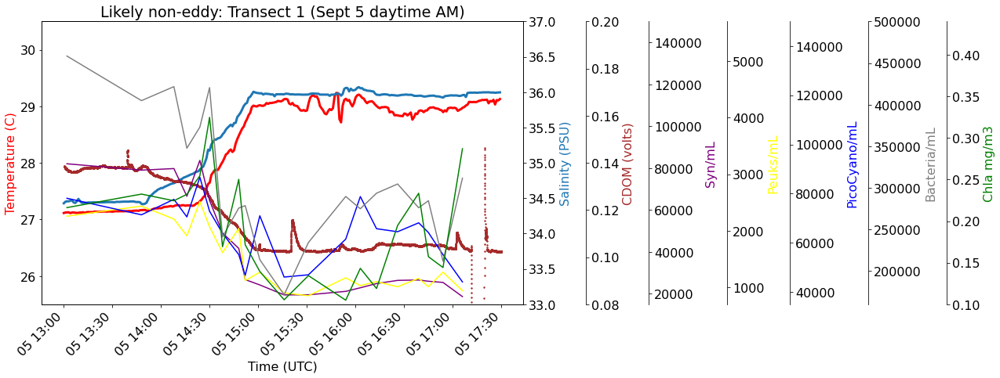

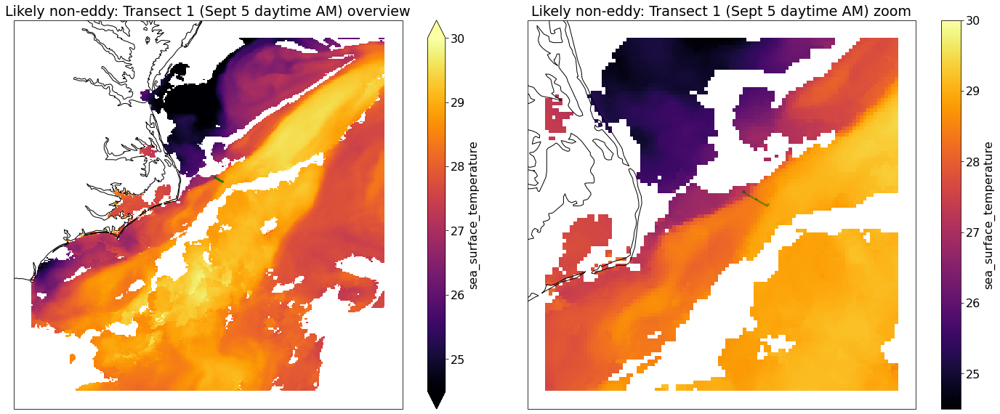

<ipython-input-146-650edb0ded04>:45: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  p3 = ax2.scatter(cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean().index, cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean()[' V'], color='brown', label='CDOM', s=2)
<ipython-input-146-650edb0ded04>:45: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  p3 = ax2.scatter(cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean().index, cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean()[' V'], color='brown', label='CDOM', s=2)


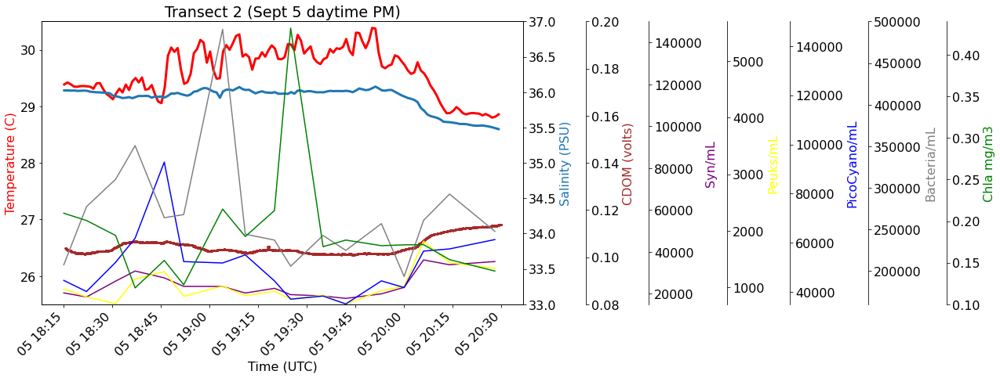

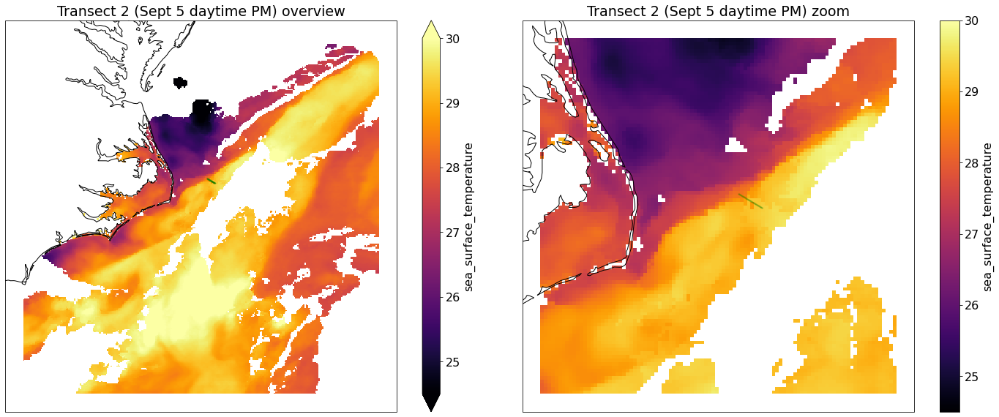

<ipython-input-146-650edb0ded04>:10: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  if fcm_df.loc[start_times[i]:end_times[i]]['Syn_Avg'].empty:
<ipython-input-146-650edb0ded04>:45: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  p3 = ax2.scatter(cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean().index, cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean()[' V'], color='brown', label='CDOM', s=2)
<ipython-input-146-650edb0ded04>:45: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  p3 = ax2.scatter(cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean().index, cdom_df.loc[start_times[i]:end_times[i]].rolling(win

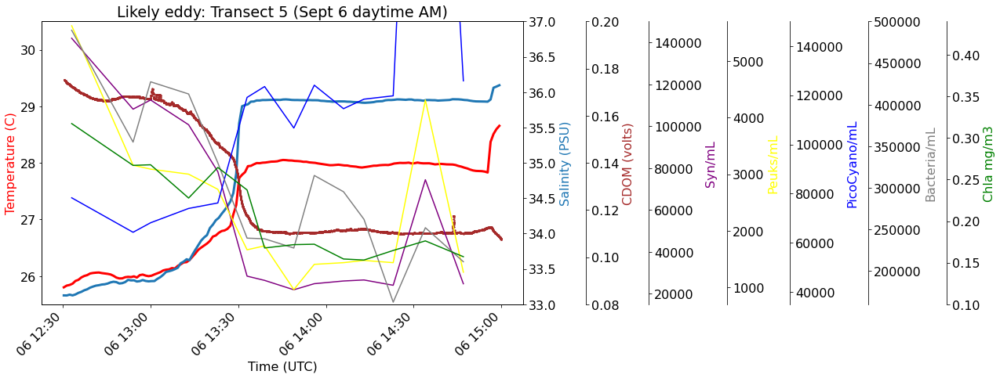

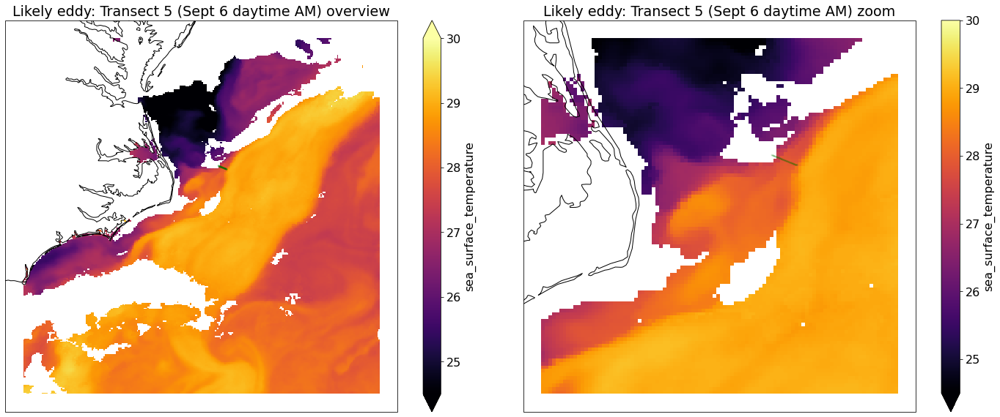

<ipython-input-146-650edb0ded04>:10: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  if fcm_df.loc[start_times[i]:end_times[i]]['Syn_Avg'].empty:
<ipython-input-146-650edb0ded04>:45: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  p3 = ax2.scatter(cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean().index, cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean()[' V'], color='brown', label='CDOM', s=2)
<ipython-input-146-650edb0ded04>:45: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  p3 = ax2.scatter(cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean().index, cdom_df.loc[start_times[i]:end_times[i]].rolling(win

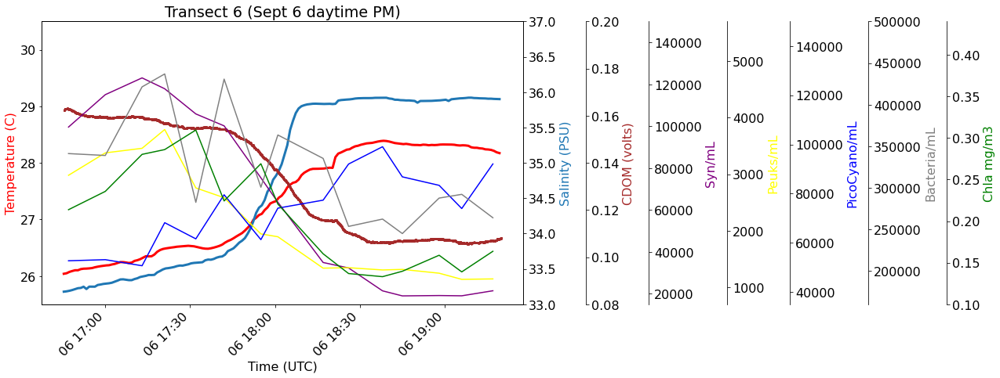

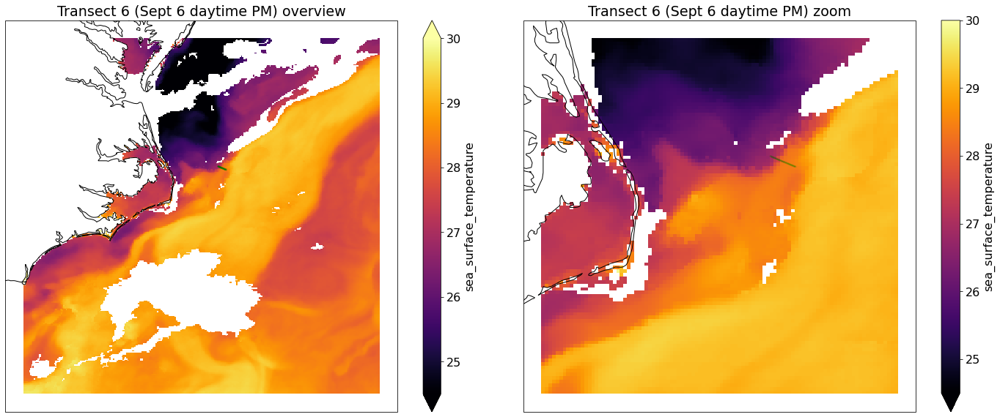

<ipython-input-146-650edb0ded04>:10: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  if fcm_df.loc[start_times[i]:end_times[i]]['Syn_Avg'].empty:
<ipython-input-146-650edb0ded04>:45: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  p3 = ax2.scatter(cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean().index, cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean()[' V'], color='brown', label='CDOM', s=2)
<ipython-input-146-650edb0ded04>:45: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  p3 = ax2.scatter(cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean().index, cdom_df.loc[start_times[i]:end_times[i]].rolling(win

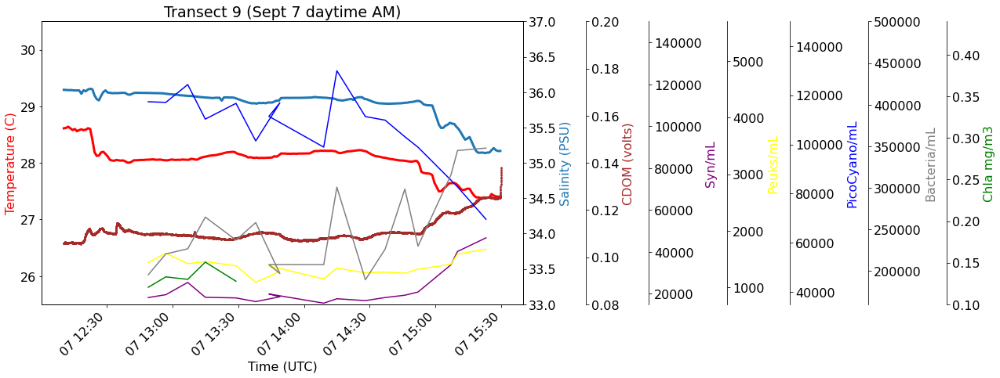

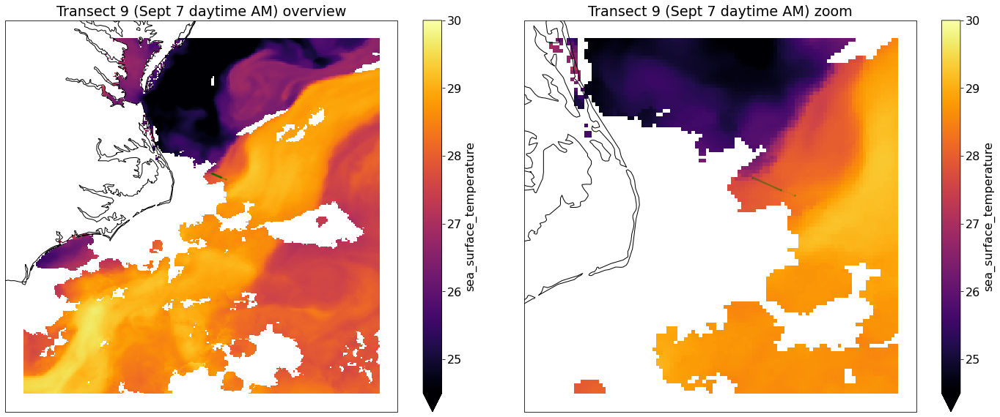

In [146]:
start_times = ['2021-09-5 13:00:00', '2021-09-5 18:15:00', '2021-09-6 1:00:00', '2021-09-6 5:10:00', '2021-09-6 12:30:00', '2021-09-6 16:45:00', '2021-09-7 2:55:00', '2021-09-7 6:45:00', '2021-09-7 12:10:00']
end_times = ['2021-09-5 17:30:00','2021-09-5 20:30:00', '2021-09-6 4:00:00', '2021-09-6 6:45:00', '2021-09-6 15:00:00', '2021-09-6 19:20:00', '2021-09-7 5:35:00', '2021-09-7 9:00:00', '2021-09-7 15:30:00']
hours = [0,0,0,0,0,0,0,0,0]

titles = ['Likely non-eddy: Transect 1 (Sept 5 daytime AM)', 'Transect 2 (Sept 5 daytime PM)', 'Transect 3 (Sept 5 nighttime)', 'Transect 4 (Sept 5 nighttime)', 
        'Likely eddy: Transect 5 (Sept 6 daytime AM)', 'Transect 6 (Sept 6 daytime PM)', 'Transect 7 (Sept 6 nighttime)', 'Transect 8 (Sept 6 nighttime)',
        'Transect 9 (Sept 7 daytime AM)']

for i in range(9):
    if fcm_df.loc[start_times[i]:end_times[i]]['Syn_Avg'].empty:
        pass
    else:
        # time series plot
        fig, ax = plt.subplots(figsize=(18,7))

        ax1 = ax.twinx()
        ax2 = ax.twinx()
        ax3 = ax.twinx()
        ax4 = ax.twinx()
        ax5 = ax.twinx()
        ax6 = ax.twinx()
        ax7 = ax.twinx()

        ax.set_ylim(25.5, 30.5)
        ax1.set_ylim(33, 37)
        ax2.set_ylim(.08, .2)
        ax3.set_ylim(15000, 150000)
        ax4.set_ylim(700, 5700)
        ax5.set_ylim(35000, 150000)
        ax6.set_ylim(160000, 500000)
        ax7.set_ylim(.1, .44)

        ax.set_xlabel("Time (UTC)")
        ax.set_ylabel("Temperature (C)")
        ax1.set_ylabel("Salinity (PSU)")
        ax2.set_ylabel("CDOM (volts)")
        ax3.set_ylabel("Syn/mL")
        ax4.set_ylabel("Peuks/mL")
        ax5.set_ylabel("PicoCyano/mL")
        ax6.set_ylabel("Bacteria/mL")
        ax7.set_ylabel("Chla mg/m3")

        p1, = ax.plot(df.loc[start_times[i]:end_times[i]].index, df.loc[start_times[i]:end_times[i]]['TSG--temp-SBE38'], color='red', label='Temp', lw=3)
        p2, = ax1.plot(df.loc[start_times[i]:end_times[i]].index, df.loc[start_times[i]:end_times[i]]['TSG--sal'], label='Salinity', lw=3)
        p3 = ax2.scatter(cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean().index, cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean()[' V'], color='brown', label='CDOM', s=2)

        p4, = ax3.plot(fcm_df.loc[start_times[i]:end_times[i]].index, fcm_df.loc[start_times[i]:end_times[i]]['Syn_Avg'], label='Syn/mL', color='purple')
        p5, = ax4.plot(fcm_df.loc[start_times[i]:end_times[i]].index, fcm_df.loc[start_times[i]:end_times[i]]['Peuks_Avg'], label='Peuks/mL', color='yellow')
        p6, = ax5.plot(fcm_df.loc[start_times[i]:end_times[i]].index, fcm_df.loc[start_times[i]:end_times[i]]['PicoCyano_Avg'], label='PicoCyano/mL', color='blue')
        p7, = ax6.plot(fcm_df.loc[start_times[i]:end_times[i]].index, fcm_df.loc[start_times[i]:end_times[i]]['Bacteria_Avg'], label='Bacteria/mL', color='grey')
        p8, = ax7.plot(fcm_df.loc[start_times[i]:end_times[i]].index, fcm_df.loc[start_times[i]:end_times[i]]['Chla_Avg'], label='Chla mg/m3', color='green')
        
        
        
        ax.set_title(titles[i])

        lns = [p1, p2, p3, p4,p5,p6,p7,p8]
        #ax.legend(handles=lns, loc='best')

        # right, left, top, bottom
        ax2.spines['right'].set_position(('outward', 80))
        ax3.spines['right'].set_position(('outward', 160))
        ax4.spines['right'].set_position(('outward', 260))
        ax5.spines['right'].set_position(('outward', 340))
        ax6.spines['right'].set_position(('outward', 440))
        ax7.spines['right'].set_position(('outward', 540))

        # no x-ticks                 
    #     ax2.xaxis.set_ticks([])
        fig.autofmt_xdate(rotation=45)

        # Sometimes handy, same for xaxis
        #par2.yaxis.set_ticks_position('right')

        # Move "Velocity"-axis to the left
        # par2.spines['left'].set_position(('outward', 60))
        # par2.spines['left'].set_visible(True)
        # par2.yaxis.set_label_position('left')
        # par2.yaxis.set_ticks_position('left')

        ax.yaxis.label.set_color(p1.get_color())
        ax1.yaxis.label.set_color(p2.get_color())
        ax2.yaxis.label.set_color('brown')
        ax3.yaxis.label.set_color(p4.get_color())
        ax4.yaxis.label.set_color(p5.get_color())
        ax5.yaxis.label.set_color(p6.get_color())
        ax6.yaxis.label.set_color(p7.get_color())
        ax7.yaxis.label.set_color(p8.get_color())

        # Adjust spacings w.r.t. figsize
        fig.tight_layout()
        fig.savefig('figs/'+titles[i] +'.png')
    #     plt.close()
        plt.show()



        # SST image

        fig, ax = plt.subplots(1,2, figsize=(20,8), subplot_kw=dict(projection=crs.PlateCarree()))
        ax[0].coastlines(resolution='10m')
        goes_ds.sel(time=slice(pd.to_datetime(start_times[i])-timedelta(hours=hours[i]), pd.to_datetime(end_times[i])+timedelta(hours=hours[i]))).sea_surface_temperature[:,:,:].mean(dim='time').plot(ax=ax[0], vmin=24.5, vmax=30, cmap='inferno')
        gdf.loc[start_times[i]:end_times[i]].plot(ax=ax[0], markersize=2, color='green', alpha=.05)

        ax[1].coastlines(resolution='10m')
        goes_ds.sel(time=slice(pd.to_datetime(start_times[i])-timedelta(hours=hours[i]), pd.to_datetime(end_times[i])+timedelta(hours=hours[i]))).sea_surface_temperature[:,75:175, 100:200].mean(dim='time').plot(ax=ax[1], vmin=24.5, vmax=30, cmap='inferno')
        gdf.loc[start_times[i]:end_times[i]].plot(ax=ax[1], markersize=2, color='green', alpha=.05)
        # fig.savefig('sst_sept0523_studypoints.png',dpi=400)
        ax[0].set_title(titles[i] + ' overview')
        ax[1].set_title(titles[i] + ' zoom')
        fig.tight_layout()
    #     fig.savefig('figs/'+titles[i] +'sat_overview.png')
    #     plt.close()
        plt.show()

        # fig.savefig('transect' + str(i) '_s_t.png')

In [93]:
eval('(1280,960)')

(1280, 960)